In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sys, os, glob, re
import sklearn
%matplotlib inline  

## Get Data

In [2]:
snid_dir = './allSNIDtemp/'
os.chdir('./allSNIDtemp/')
all_spec = glob.glob('*.lnw')
os.chdir('..')

In [3]:
# Get List of spectra files that are type Ib or Ic

# For some reason, these files do not have a standard organization, which makes it
# stupidly aggravating to load them all. Here we search for spectra of type Ib or Ic
# and find the line number where the wavelength 2501.69 appears (this is the first).
Ib_Ic = []
Ib_Ic_names = []
skiprows = []
for spec_name in all_spec:
    path = snid_dir + spec_name
    with open(path, 'r') as f:
        lines = f.readlines()
        header = lines[0].split()
        SN_type = int(header[-2])
        if ((SN_type == 2) or (SN_type == 3)): 
            Ib_Ic.append(path)
            Ib_Ic_names.append(spec_name)
            #the first observed wavelength is always 2501.69
            first_wvl = '2501.69'
            for i in range(len(lines)-1):
                line = lines[i]
                if first_wvl in line:
                    skiprows.append(i)
                    break

In [4]:
print "There are %d type Ib and Ic SN"%(len(Ib_Ic))

There are 153 type Ib and Ic SN


In [5]:
# For each spectra, skip all the header lines about removing continuum and load the phase=0
# spectra into a numpy array. Do some data processing like filtering for desired wavelengths and 
# normalizing data.

spectra = []
for i in range(len(Ib_Ic)-1):
    spec = Ib_Ic[i]
    skiprow = skiprows[i]
    s = np.loadtxt(spec,skiprows=skiprow, usecols=(0,1))
    
    # check that first wvl is 2501.69
    if not(s[0][0] == 2501.69): print 'first wavelength is not 2501.69'
    
    # filter for desired wavelengths
    mask = np.logical_and(s[:,0]>4000, s[:,0]<7000)
    s = s[mask]
    spectra.append(s)

In [6]:
# Organize spectra in an (N x M) array, where N is the number of spectra, and M is the dimensionality
# (ie number of data points in spectrum) of a spectrum. We treat each wavelength as independent
# and zero the means and unify the standard deviations.

wavelengths = np.array(spectra[0][:,0])
spectra_matrix = np.ndarray((len(spectra),spectra[0].shape[0]))
for i, spec in enumerate(spectra):
    spectra_matrix[i,:] = spec[:,1]
    
spectra_mean = np.mean(spectra_matrix, axis=1)
spectra_std = np.std(spectra_matrix, axis=1)



In [7]:
np.mean(spectra_matrix,axis=0).shape

(414,)

In [8]:
original_spectra = np.copy(spectra_matrix)
spectra_matrixT = (spectra_matrix.T - spectra_mean)/spectra_std
spectra_matrix = spectra_matrixT.T

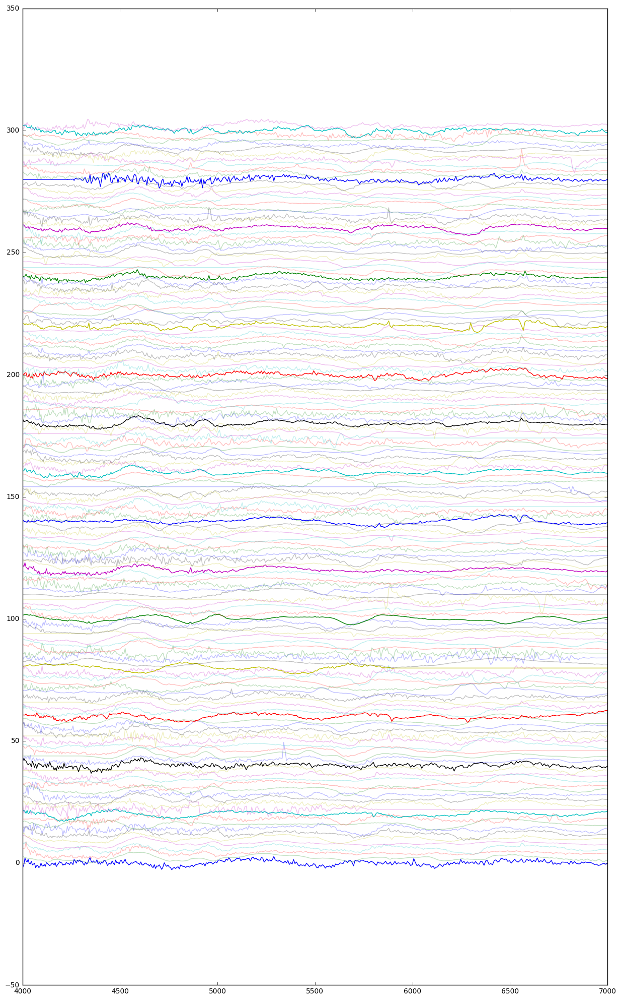

In [9]:
plt.figure(figsize=(15,25))
for i,spec in enumerate(spectra_matrix):
    alpha=0.25
    if not i%10:
        alpha=1
    plt.plot(wavelengths,spec+i*2, alpha=alpha)

## Rebin

In [10]:
print spectra_matrix.shape
print wavelengths.shape

(152, 414)
(414,)


In [11]:
nrows, ncols = spectra_matrix.shape
smoothing = 9 # Width of bins in terms of number of wavelength steps
tmp = np.reshape(spectra_matrix,(nrows, ncols/smoothing, smoothing))

In [12]:
spectra_matrix = np.mean(tmp, axis=2)

In [13]:
spectra_matrix.shape

(152, 46)

In [14]:
wvrows = wavelengths.shape[0]
wvcols = 1
wvtemp = np.reshape(wavelengths, (wvrows/smoothing,1,smoothing))
print wvtemp.shape
wavelengths = np.mean(wvtemp, axis=2)

(46, 1, 9)


In [15]:
wavelengths.shape

(46, 1)

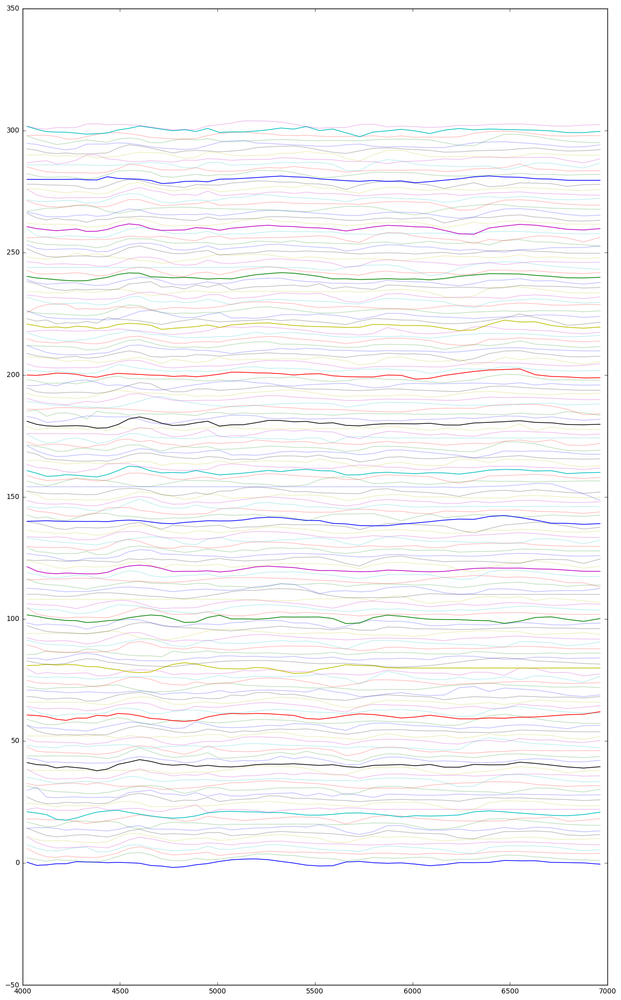

In [16]:
# Plot the spectra post data processing

plt.figure(figsize=(15,25))
for i,spec in enumerate(spectra_matrix):
    alpha=0.25
    if not i%10:
        alpha=1
    plt.plot(wavelengths,spec+i*2, alpha=alpha)

## PCA Decomposition

In [17]:
from sklearn.decomposition import PCA

#spectra_matrix = np.ndarray((len(spectra), spectra[0].shape[0]))
#for i in range(len(spectra)):
#    spectra_matrix[i,:] = spectra[i][:,1]
    
#wavelengths = spectra[0][:,0]

In [18]:
spectra_matrix.shape

(152, 46)

In [19]:
spectra_matrix

array([[ 0.30974413, -0.94771218, -0.75946141, ...,  0.17443889,
         0.06560642, -0.47267313],
       [ 0.10611685, -0.60902482, -1.29722239, ..., -0.50124837,
        -0.69771586, -0.97613837],
       [ 1.89919854, -0.08143684, -1.41597959, ..., -0.02552498,
        -0.15203263, -0.05941096],
       ..., 
       [-0.05234072,  0.12172262,  0.08764028, ..., -0.23614187,
        -0.08155415, -0.0511235 ],
       [ 1.74247316,  0.53286377, -0.4134293 , ..., -0.81251811,
        -0.81388955, -0.28862833],
       [-0.17654778, -1.06363962, -1.39426178, ..., -0.17771194,
         0.26699814,  0.49866649]])

In [20]:
pca = PCA()

In [21]:
pca.fit(spectra_matrix)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [22]:
pca.components_

array([[ -1.55419165e-01,  -3.14378237e-02,   6.50789579e-02, ...,
         -1.08964033e-04,   3.61349908e-03,  -4.46503240e-02],
       [  1.19851038e-01,   1.63267047e-01,   1.23435399e-01, ...,
          1.46874726e-02,  -6.85299299e-02,  -3.73034326e-02],
       [ -1.96735115e-01,  -2.44478205e-02,   1.28703396e-01, ...,
          8.77706279e-04,   1.30756523e-02,   1.57566611e-01],
       ..., 
       [  3.55236063e-02,  -2.06878958e-02,  -1.46193590e-02, ...,
          5.17291906e-02,  -1.37442578e-01,   2.29071332e-02],
       [ -1.89772476e-02,   5.48246889e-02,  -6.49071436e-02, ...,
          3.28511179e-02,  -1.33022948e-03,   2.33066669e-02],
       [  1.47441956e-01,   1.47441956e-01,   1.47441956e-01, ...,
          1.47441956e-01,   1.47441956e-01,   1.47441956e-01]])

/home/data/mew488/virtualenvs/mypy2.7/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


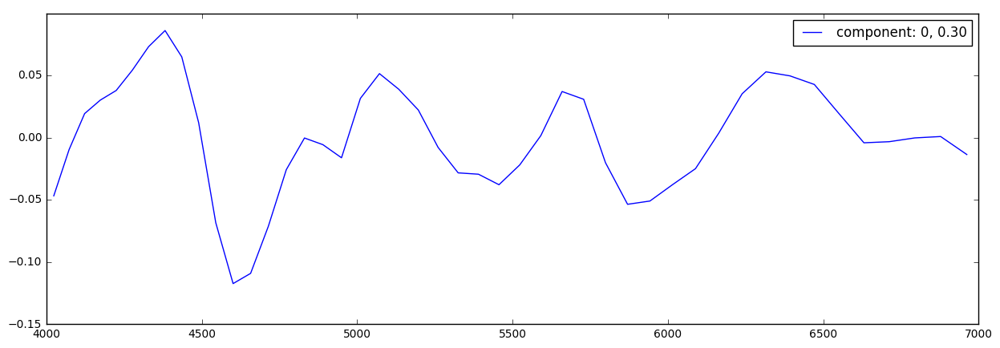

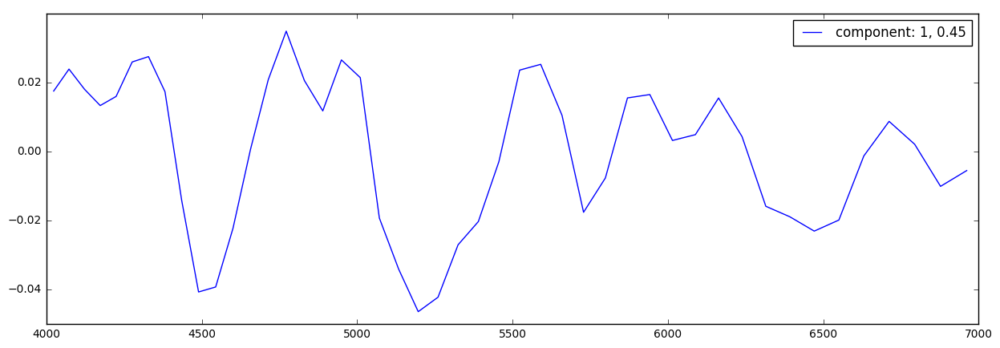

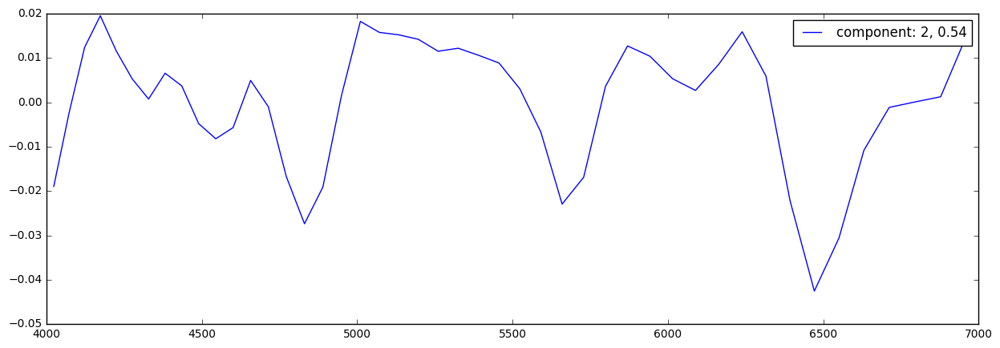

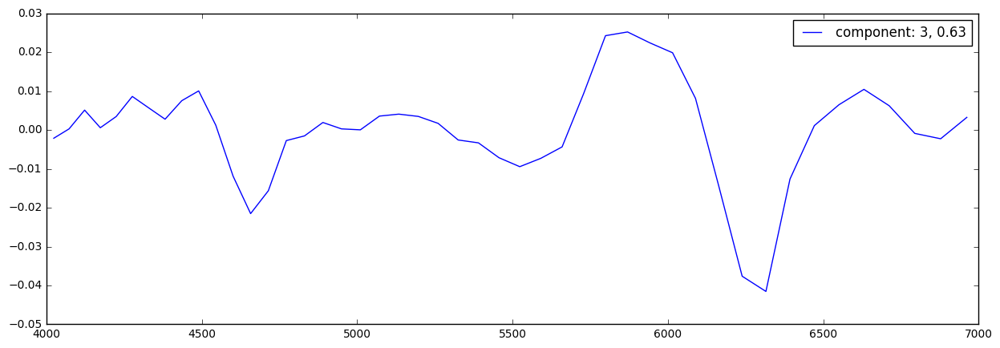

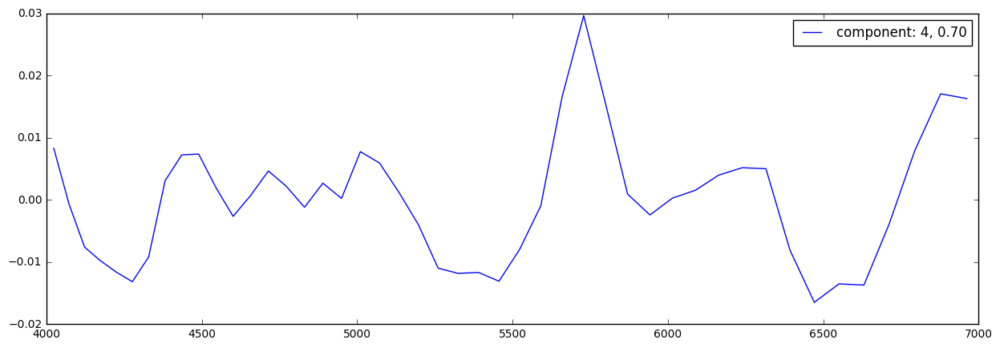

...

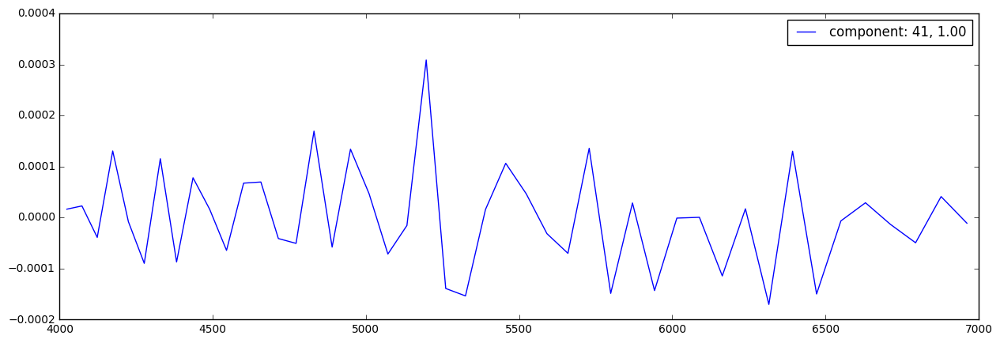

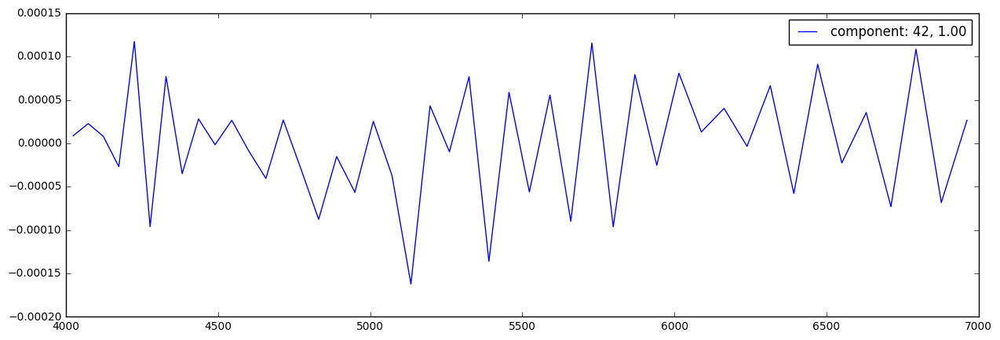

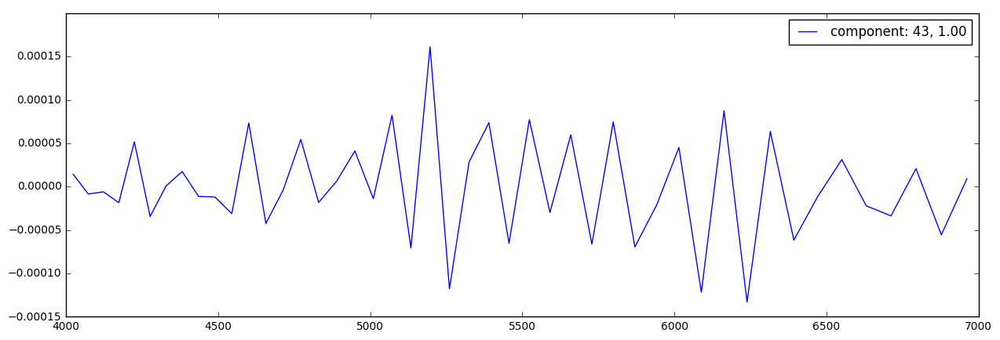

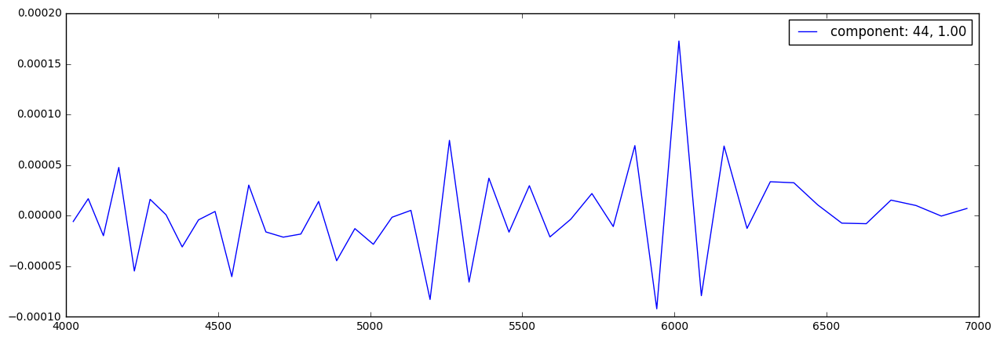

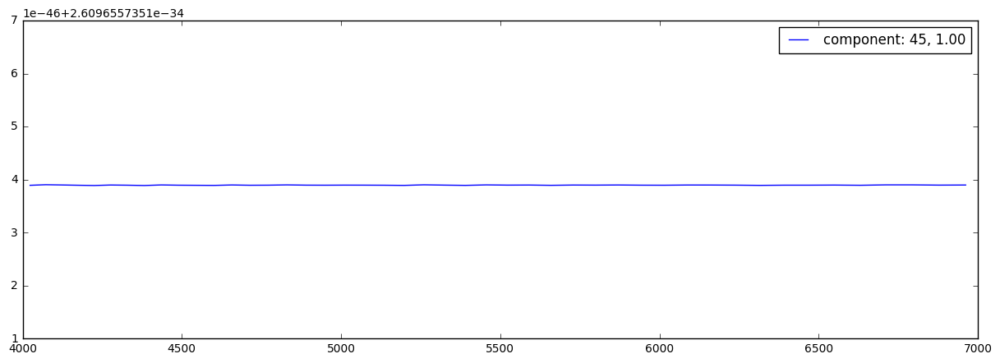

In [23]:
evecs = pca.components_
evals = pca.explained_variance_ratio_
evals_cs = evals.cumsum()

for i,ev in enumerate(evecs):
    plt.figure(figsize=(15,5))
    plt.plot(wavelengths,evals[i]*(ev), label="component: %d, %.2f"%(i,evals_cs[i]))
    plt.legend(fontsize=12)

## Recreate Spectra from PCA

[0, 4, 8, 20, 46]


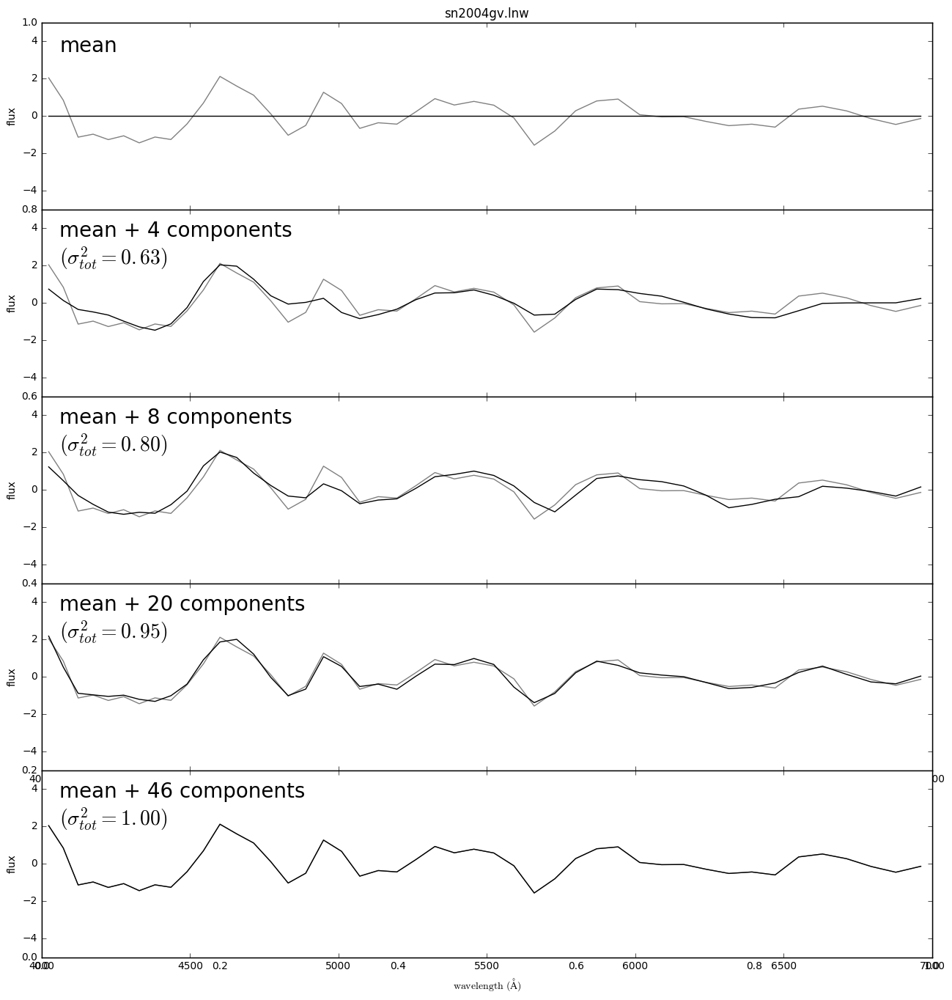

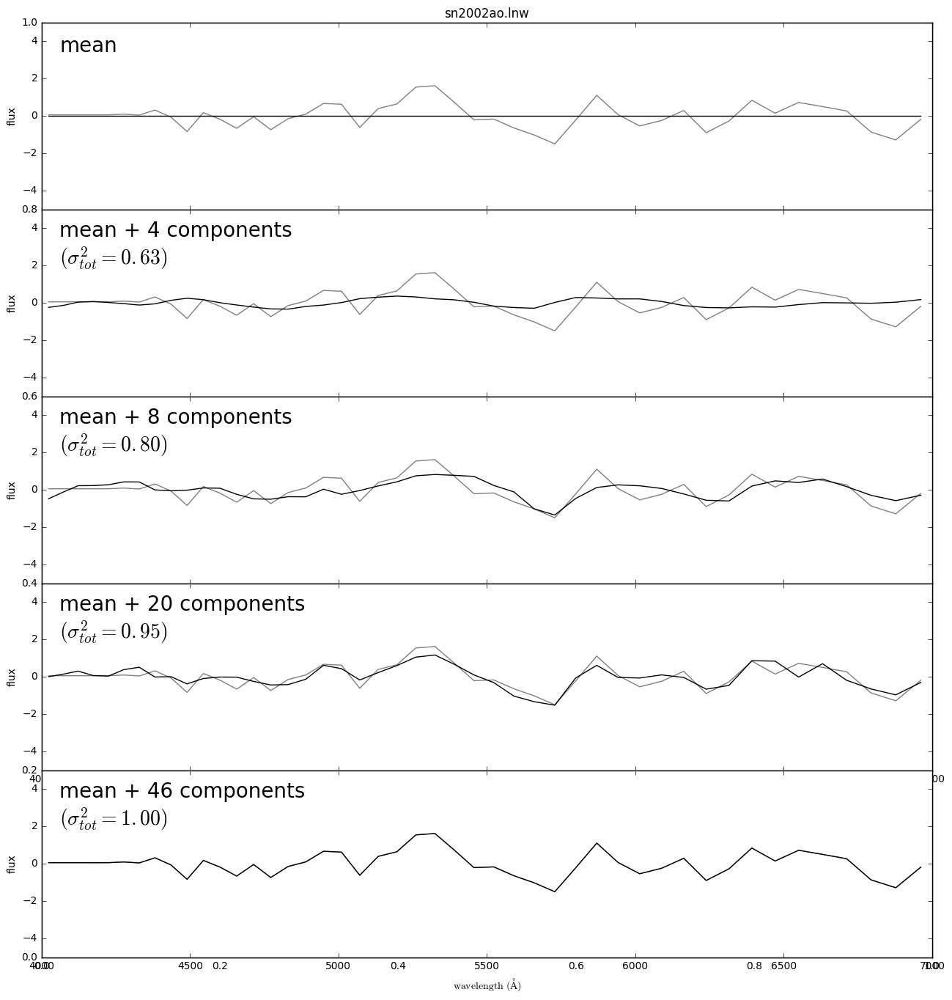

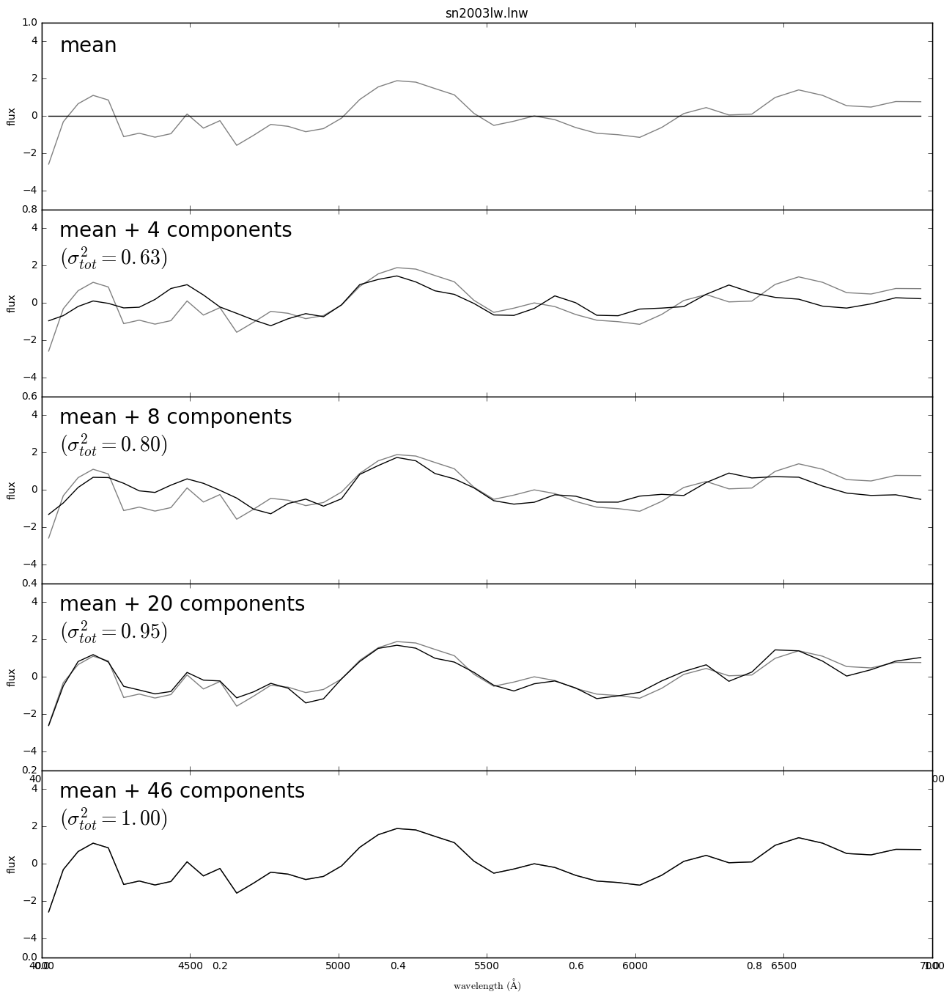

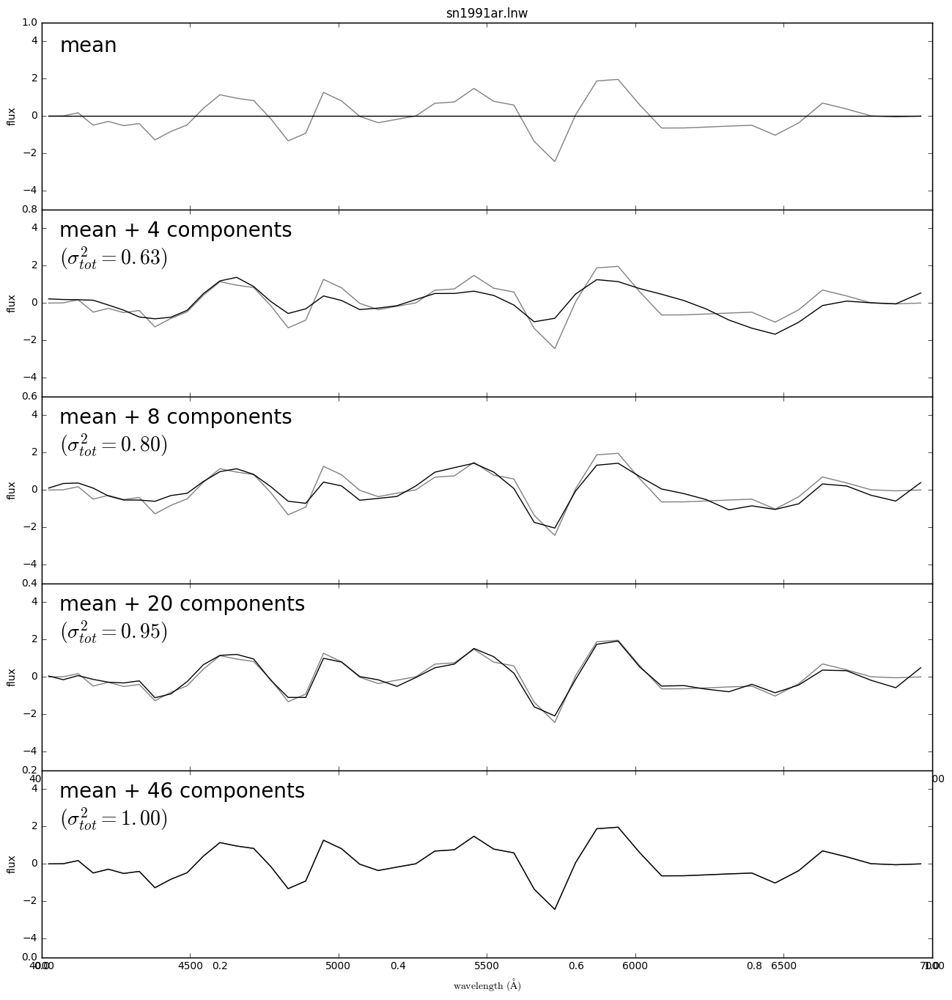

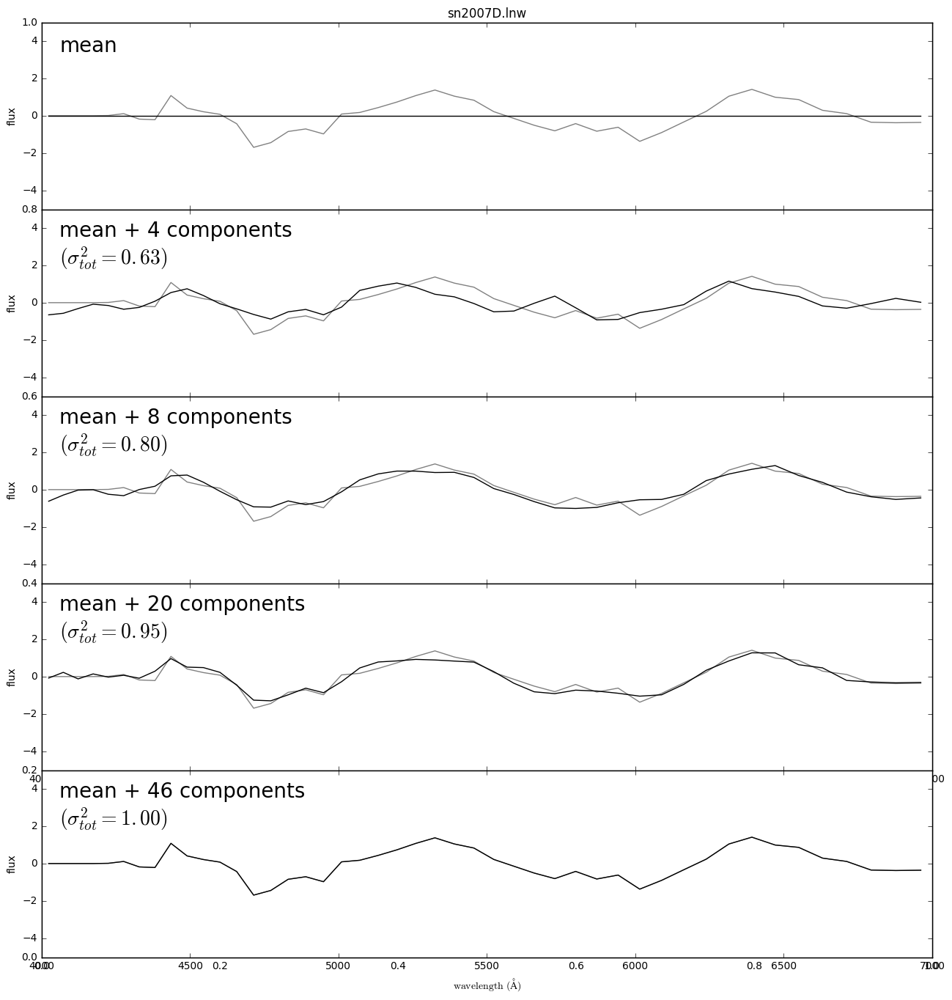

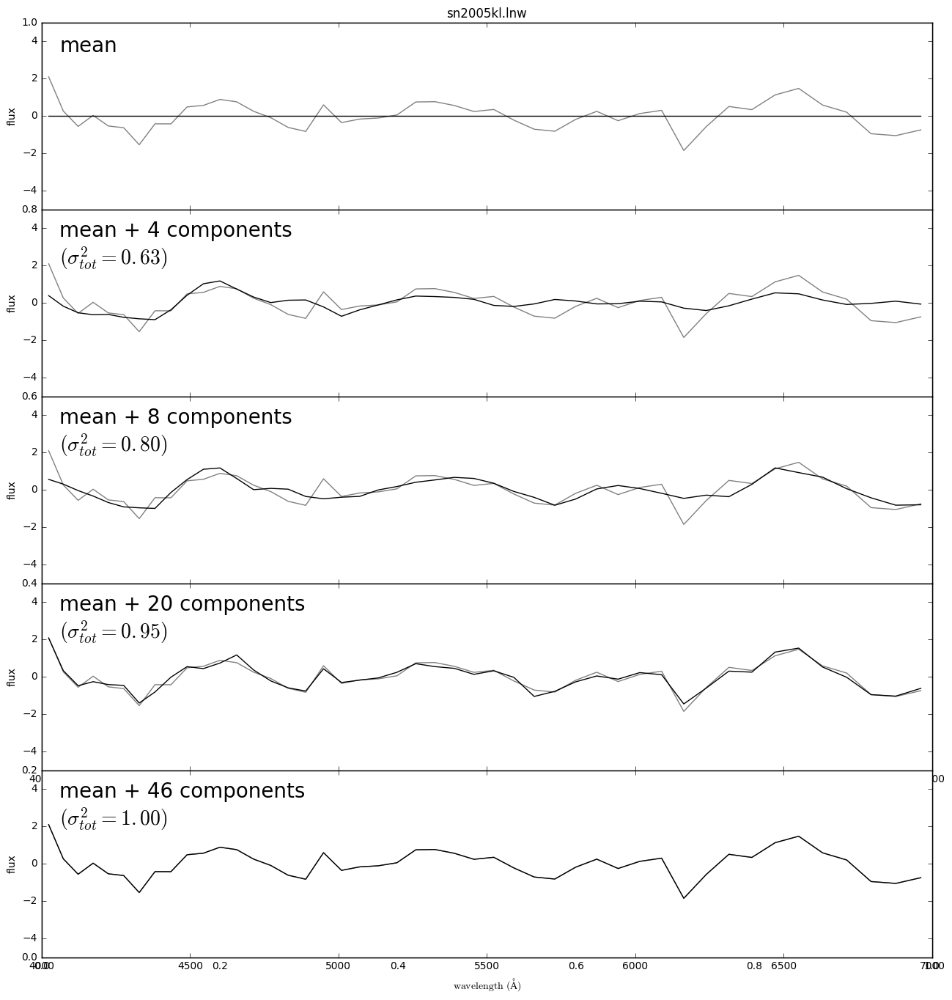

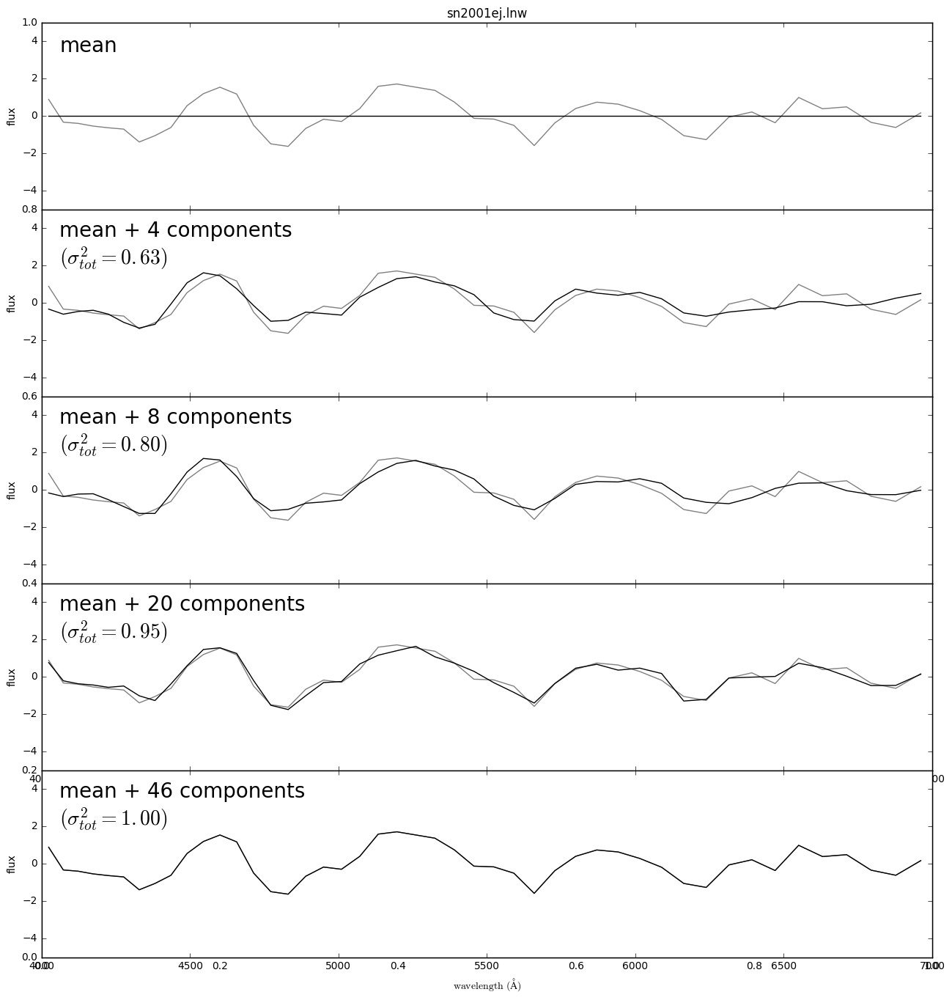

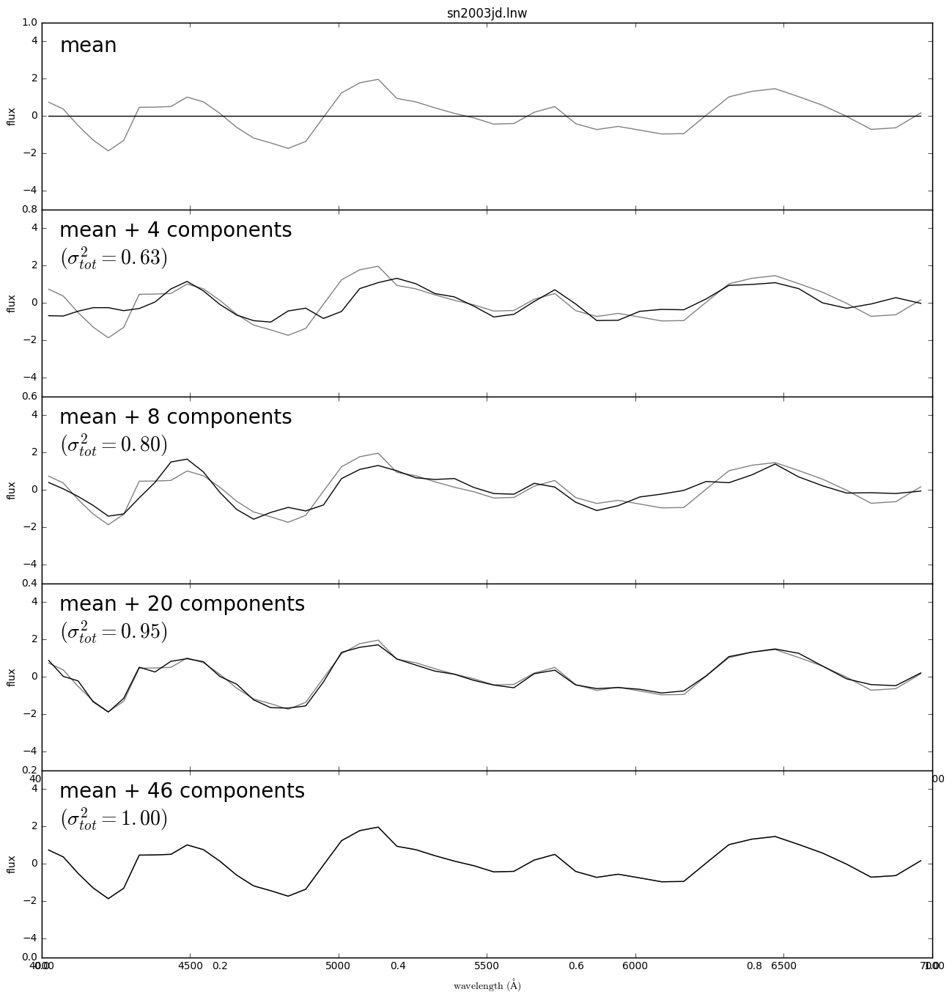

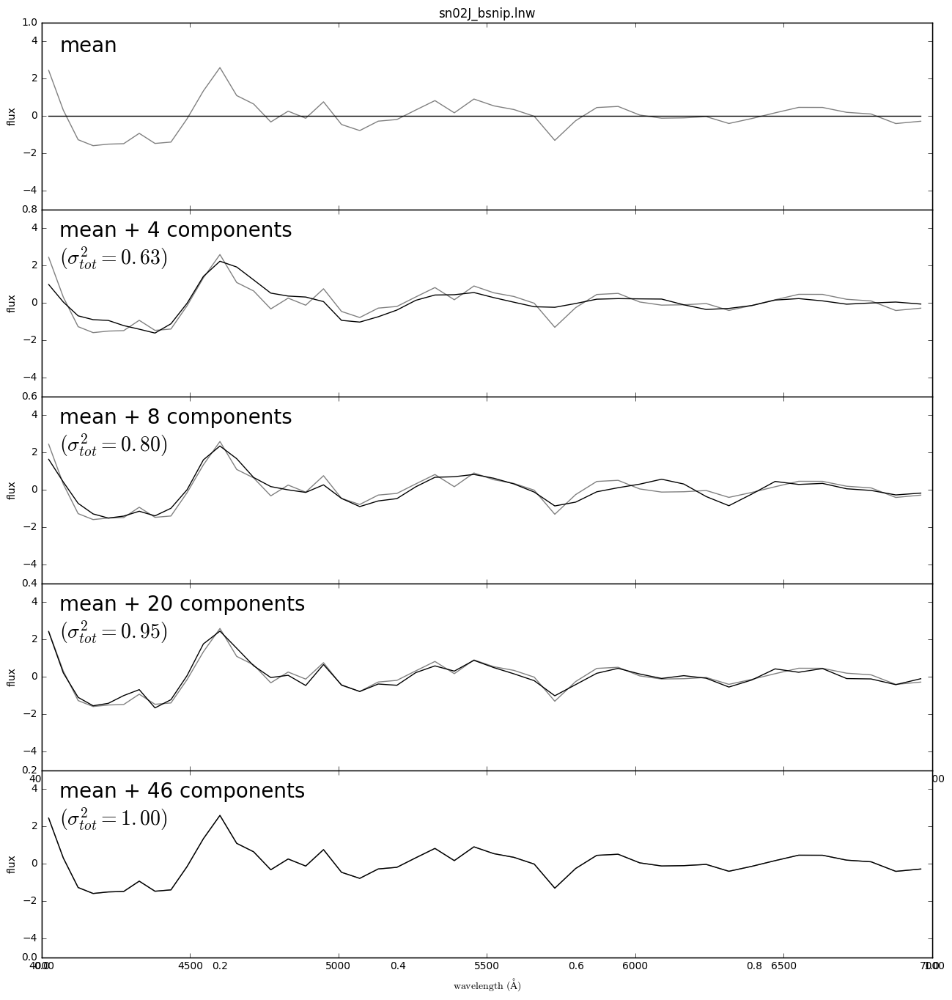

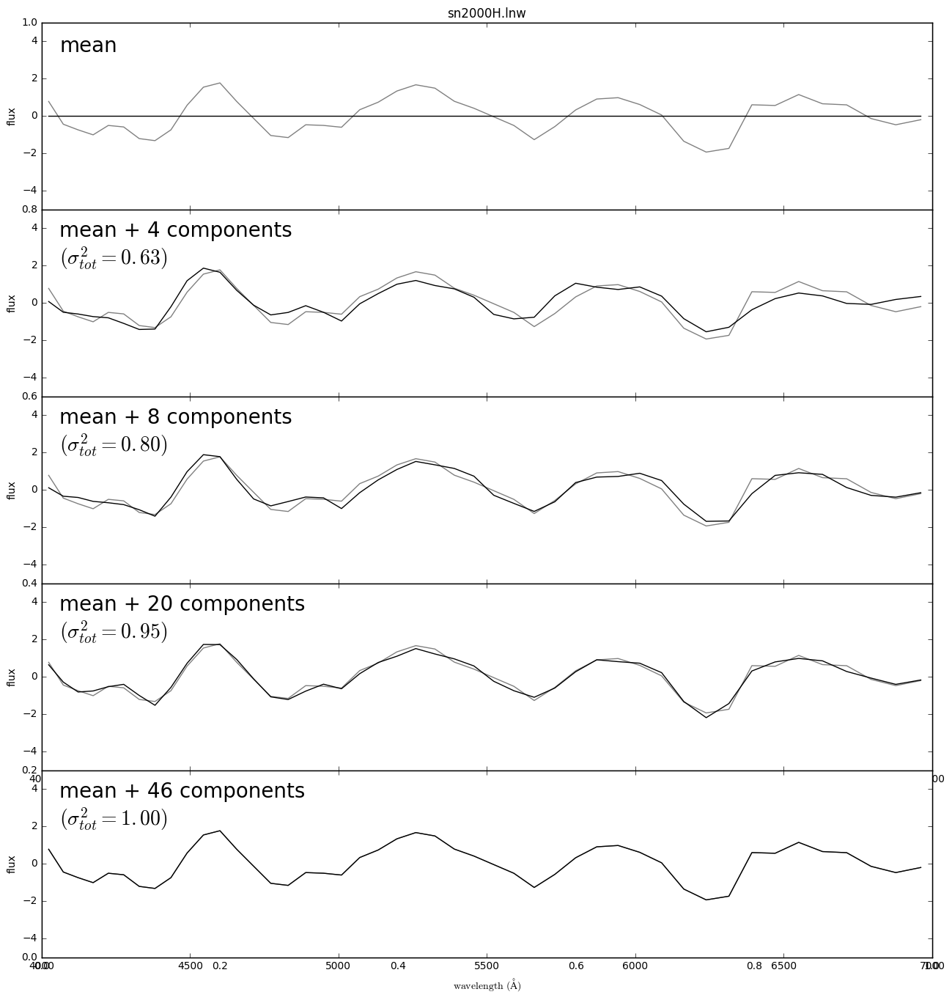

In [27]:
# Recreate 10 random spectra using the PCA decomposition
random_spec = np.random.randint(0,spectra_matrix.shape[0],10)
n_pca_components = [0,4,8,20,spectra_matrix.shape[1]]
print n_pca_components

for j,spec in enumerate(random_spec):
    spec_name = Ib_Ic_names[spec]
    true_spec = spectra_matrix[spec]
    
    pca_coeff = np.dot(evecs, spectra_matrix[spec])
    
    #------------------------------------------------------------
    # Plot the sequence of reconstructions
    fig = plt.figure(j, figsize=(15, 15))
    plt.title(spec_name)
    fig.subplots_adjust(hspace=0, top=0.95, bottom=0.1, left=0.12, right=0.93)

    for i, n in enumerate(n_pca_components):#, len(pca.components_)]):
        ax = fig.add_subplot(511 + i)
        ax.plot(wavelengths, true_spec, '-', c='gray')
        ax.plot(wavelengths, (np.dot(pca_coeff[:n], evecs[:n])), '-k')
        
        if i < 3:
            ax.xaxis.set_major_formatter(plt.NullFormatter())
            
        ax.set_ylim(-5, 5)
        ax.set_ylabel('flux')

        if n == 0:
            text = "mean"
        elif n == 1:
            text = "mean + 1 component\n"
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
        else:
            text = "mean + %i components\n" % n
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
            
        ax.text(0.02, 0.93, text, fontsize=20,ha='left', va='top', transform=ax.transAxes)

        fig.axes[-1].set_xlabel(r'${\rm wavelength\ (\AA)}$')

## Kernel PCA

In [17]:
from sklearn.decomposition import KernelPCA

In [72]:
spectra_matrix
n_comp = 50

In [73]:
kpca = KernelPCA(kernel='rbf', fit_inverse_transform=True, n_components=n_comp)
k_dat = kpca.fit_transform(spectra_matrix)

In [75]:
kevecs = kpca.alphas_[0:n_comp]
kevals = kpca.lambdas_[0:n_comp]/np.sum(kpca.lambdas_)
kevals_cs = kevals.cumsum()



In [76]:
k_back_evecs = kpca.inverse_transform(kevecs)

In [77]:
k_back_evecs.shape

(50, 414)

In [78]:
print kevals_cs[10:20]
print evals_cs[10:20]

[ 0.5769039   0.59465683  0.61072274  0.62639106  0.64095084  0.6549047
  0.66833485  0.68161102  0.69465331  0.70738347]
[ 0.76518044  0.779341    0.79194409  0.80260677  0.81206388  0.82138326
  0.83023832  0.83810981  0.84531566  0.85226031]


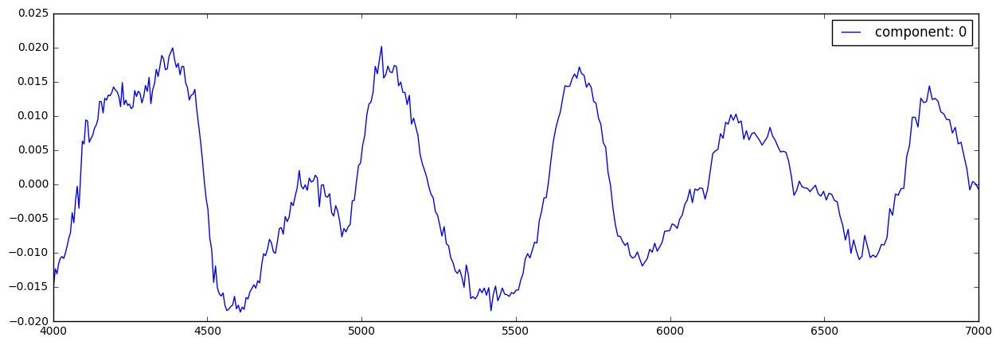

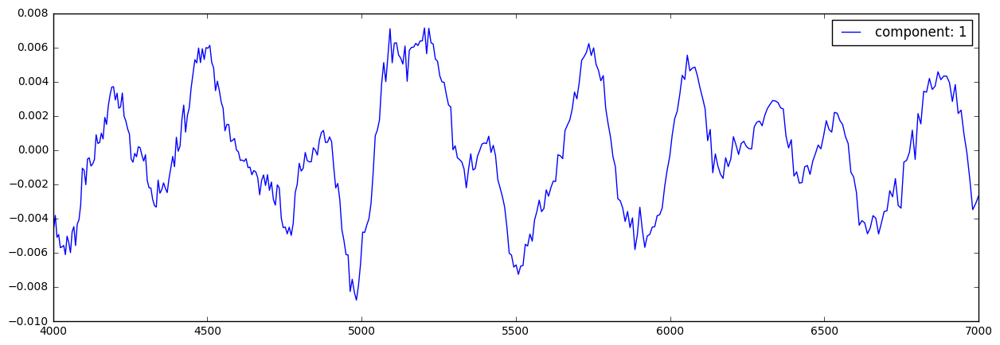

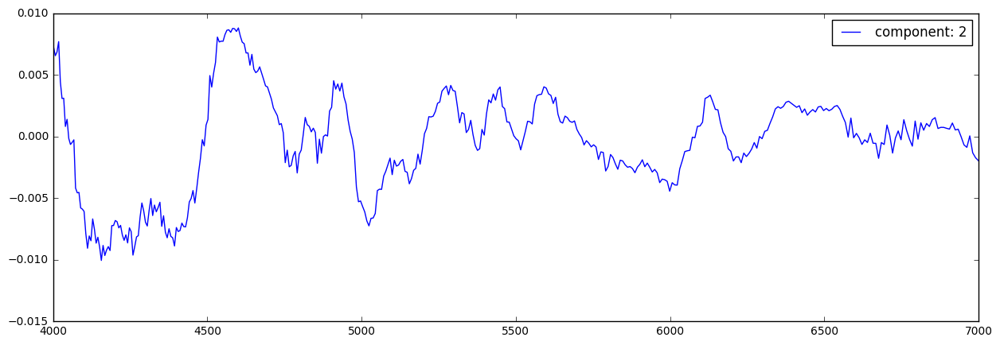

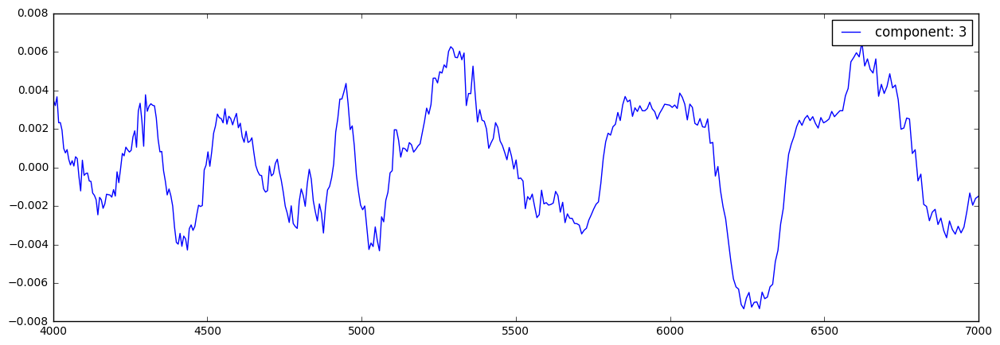

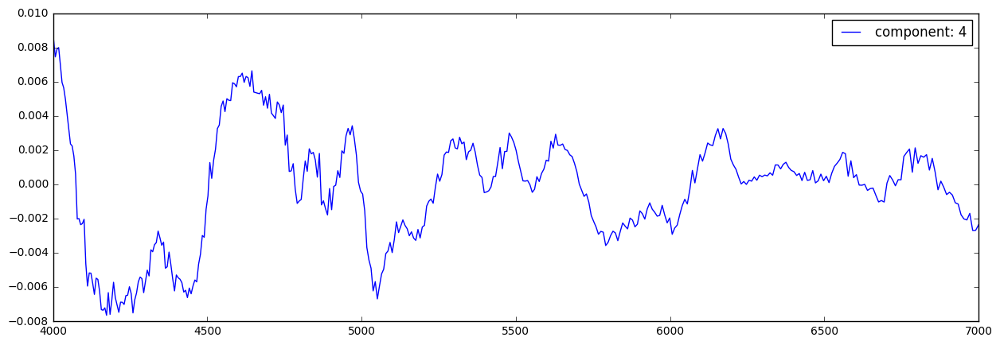

...

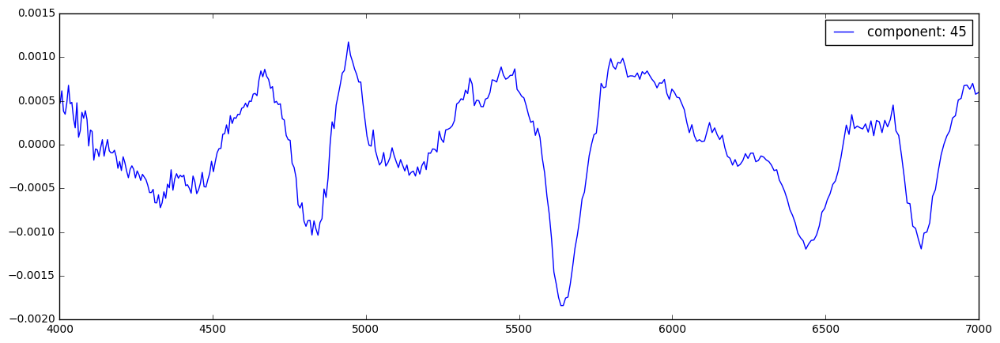

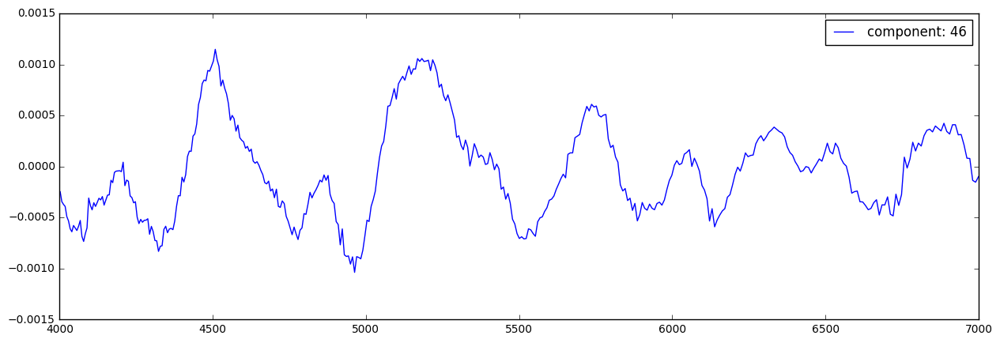

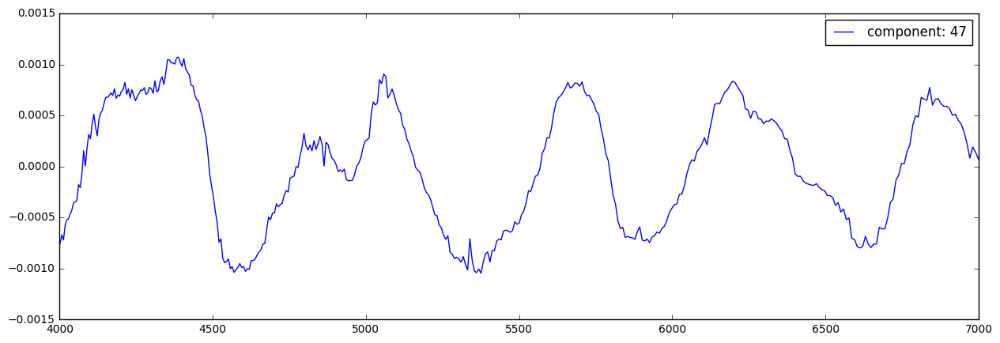

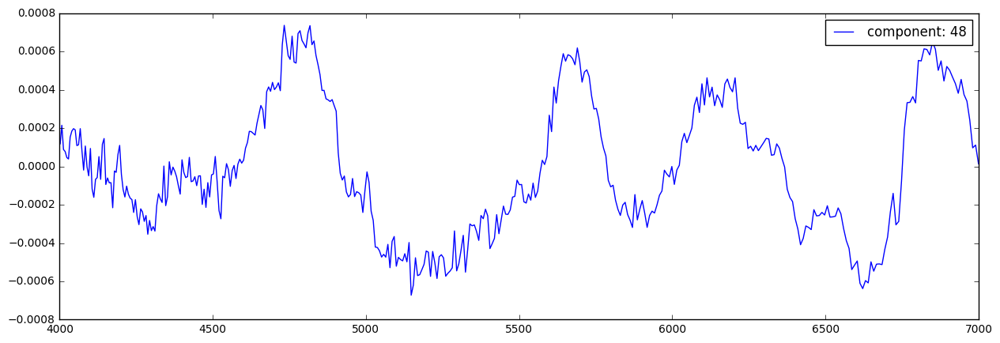

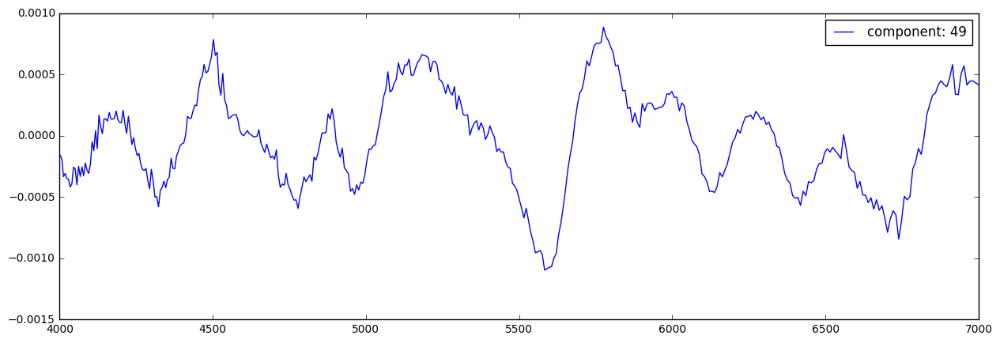

In [79]:
for i,kev in enumerate(k_back_evecs):
    plt.figure(figsize=(15,5))
    plt.plot(wavelengths,kevals[i]*(kev), label="component: %d"%i)
    plt.legend(fontsize=12)

## Reconstruct Spectra using KPCA

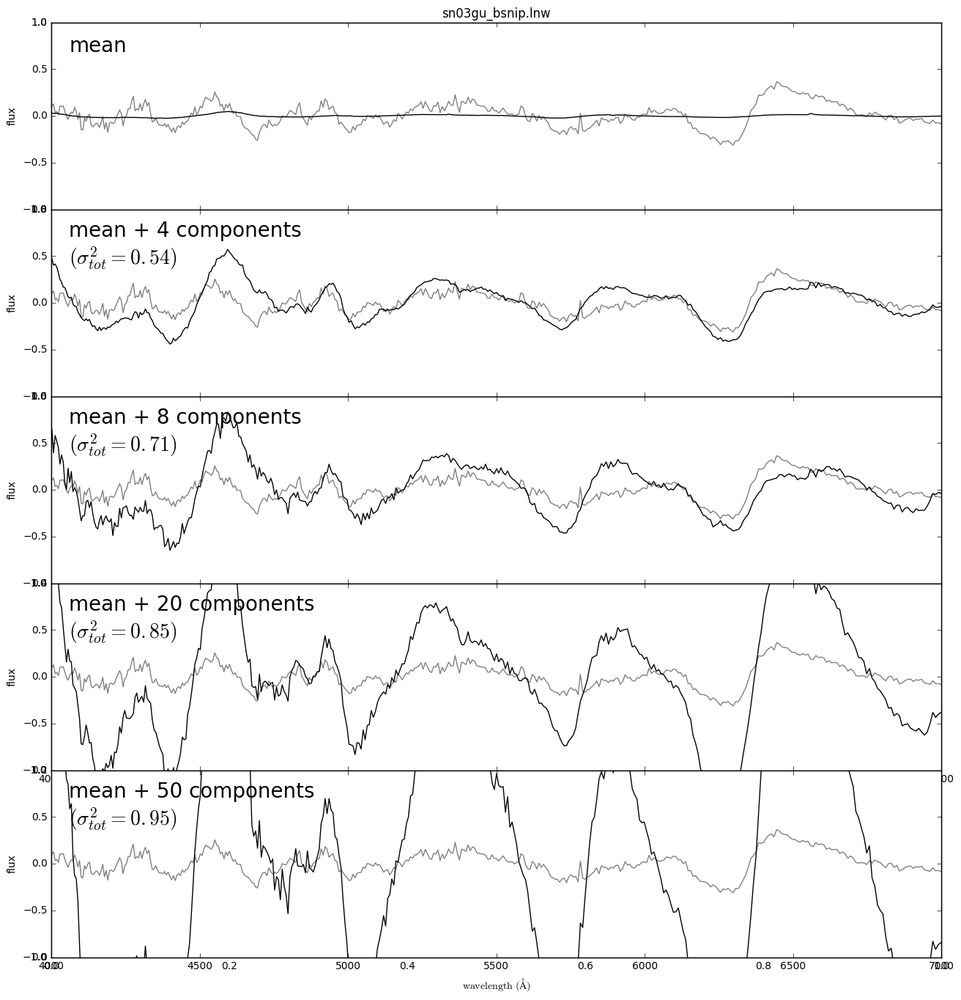

In [80]:
# Recreate 10 random spectra using the PCA decomposition
random_spec = np.random.randint(0,spectra_matrix.shape[0],1)
n_pca_components = [0,4,8,20,n_comp]

for j,spec in enumerate(random_spec):
    spec_name = Ib_Ic_names[spec]
    true_spec = (spectra_matrix[spec] + spectra_mean)*spectra_std
    
    pca_coeff = np.dot(k_back_evecs, spectra_matrix[spec])
    
    #------------------------------------------------------------
    # Plot the sequence of reconstructions
    fig = plt.figure(j, figsize=(15, 15))
    plt.title(spec_name)
    fig.subplots_adjust(hspace=0, top=0.95, bottom=0.1, left=0.12, right=0.93)

    for i, n in enumerate(n_pca_components):#, len(pca.components_)]):
        ax = fig.add_subplot(511 + i)
        ax.plot(wavelengths, true_spec, '-', c='gray')
        ax.plot(wavelengths, (spectra_mean + np.dot(pca_coeff[:n], k_back_evecs[:n]))*spectra_std, '-k')
        
        if i < 3:
            ax.xaxis.set_major_formatter(plt.NullFormatter())
            
        ax.set_ylim(-1, 1)
        ax.set_ylabel('flux')

        if n == 0:
            text = "mean"
        elif n == 1:
            text = "mean + 1 component\n"
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
        else:
            text = "mean + %i components\n" % n
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
            
        ax.text(0.02, 0.93, text, fontsize=20,ha='left', va='top', transform=ax.transAxes)

        fig.axes[-1].set_xlabel(r'${\rm wavelength\ (\AA)}$')